In [2]:
# 1. Imports and setup
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt
import folium


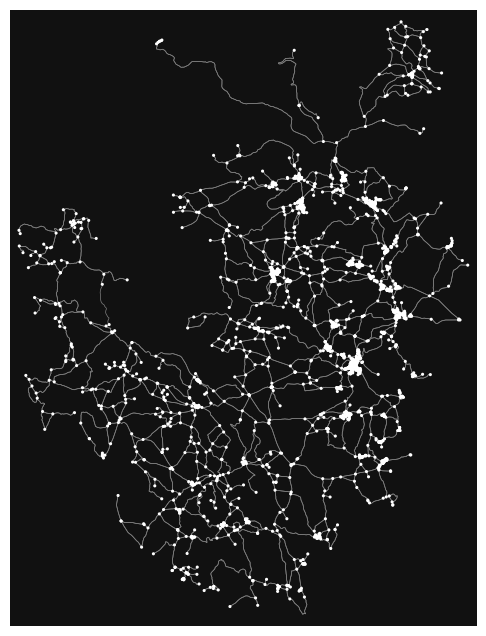

In [27]:

# Configure OSMnx
# ox.config(use_cache=True, log_console=True)

# 2. Define area of interest
place_name = "Peak District"

# 3. Download road network (driveable roads only)
G = ox.graph_from_place(place_name, network_type="drive")

# Optional: simplify the graph
# G = ox.simplify_graph(G)

# 4. Plot static graph
fig, ax = ox.plot_graph(G, node_size=5, edge_color='gray', edge_linewidth=0.5)


In [4]:
# Convert graph to GeoDataFrames
nodes, edges = ox.graph_to_gdfs(G)

# Create a folium map centered on Manchester
m = folium.Map(zoom_start=11, tiles='cartodbpositron')

# Add edges to the map
for _, row in edges.iterrows():
    if isinstance(row['geometry'], list):
        # Skip any weird geometry
        continue
    folium.PolyLine(locations=[(lat, lon) for lon, lat in row['geometry'].coords],
                    color='blue',
                    weight=1).add_to(m)

m

<Axes: >

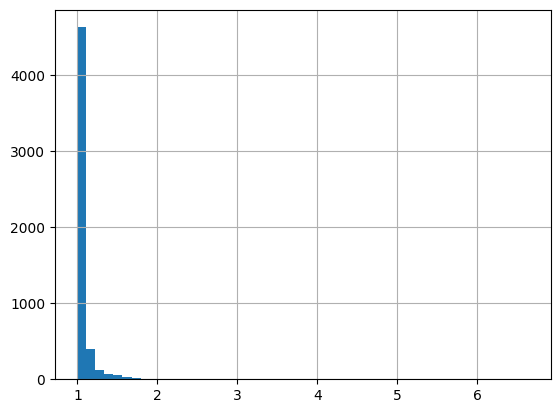

In [5]:
import numpy as np
from shapely.geometry import LineString

def calculate_curviness(row):
    geom = row.geometry
    if isinstance(geom, LineString):
        actual_length = geom.length
        start, end = geom.coords[0], geom.coords[-1]
        straight_distance = np.linalg.norm(np.array(end) - np.array(start))
        if straight_distance == 0:
            return 1  # Avoid division by zero
        return actual_length / straight_distance
    return None

edges['curviness'] = edges.apply(calculate_curviness, axis=1)

edges['curviness'].hist(bins=50)

In [6]:
import pandas as pd
import branca

# Logarithmic transformation for non-symmetrical scaling
def get_color(val, vmin, vmax):
    norm = plt.Normalize(vmin=np.log(vmin+1), vmax=np.log(vmax+1))  # Add 1 to avoid log(0)
    cmap = plt.get_cmap('plasma')
    rgba = cmap(norm(np.log(val+1)))  # Log transformation here
    return f'rgba({int(rgba[0]*255)}, {int(rgba[1]*255)}, {int(rgba[2]*255)}, {rgba[3]})'

# Create folium map centered on Manchester
m = folium.Map(zoom_start=11, tiles='cartodbpositron')

# Add edges with color based on curviness
for _, row in edges.iterrows():
    if isinstance(row['geometry'], LineString) and not pd.isnull(row['curviness']):
        coords = [(lat, lon) for lon, lat in row['geometry'].coords]
        color = get_color(row['curviness'], edges['curviness'].min(), edges['curviness'].max())
        folium.PolyLine(locations=coords, color=color, weight=2, opacity=0.8).add_to(m)

# Adjust the colormap and make it non-symmetrical
colormap = plt.cm.plasma
colormap = branca.colormap.LinearColormap(colors=[colormap(0), colormap(0.5), colormap(1)],
                                          vmin=np.log(edges['curviness'].min() + 1),  # Log transformation
                                          vmax=np.log(edges['curviness'].max() + 1))  # Log transformation
colormap.caption = 'Road Curviness'
colormap.add_to(m)

m


In [7]:
import zipfile

with zipfile.ZipFile("C://Users\khong\Documents\Python Projects\Drive\Drive\data\great-britain.c_300.kmz", "r") as kmz:
    kmz.extractall("extracted_kml")

<>:3: SyntaxWarning: invalid escape sequence '\k'
<>:3: SyntaxWarning: invalid escape sequence '\k'
C:\Users\khong\AppData\Local\Temp\ipykernel_13652\50680251.py:3: SyntaxWarning: invalid escape sequence '\k'
  with zipfile.ZipFile("C://Users\khong\Documents\Python Projects\Drive\Drive\data\great-britain.c_300.kmz", "r") as kmz:


In [8]:
import geopandas as gpd

gdf = gpd.read_file("extracted_kml\great-britain\doc.kml", driver='KML')

<>:3: SyntaxWarning: invalid escape sequence '\g'
<>:3: SyntaxWarning: invalid escape sequence '\g'
C:\Users\khong\AppData\Local\Temp\ipykernel_13652\1520658972.py:3: SyntaxWarning: invalid escape sequence '\g'
  gdf = gpd.read_file("extracted_kml\great-britain\doc.kml", driver='KML')


In [9]:
print(gdf.iloc[0])

Name                                                       B8073
Description    <div style="width: 500px">Curvature: 24835.78<...
geometry       LINESTRING (-5.986953 56.494243, -5.987263 56....
Name: 0, dtype: object


In [10]:
print(gdf.iloc[0]["Description"])

<div style="width: 500px">Curvature: 24835.78<br/>Distance: 30.82 mi<br/>Type: secondary<br/>Surface: asphalt, unknown<br/><br/>Constituent ways - <em>Open/edit in OpenStreetMap:</em><br/><table style="width: 100%; text-align: center;"><tr><th>View</th><th>Surface</th><th>Curv.</th><th>Length</th><th>Name</th><th>Actions</th></tr><tr><td><a href="https://www.openstreetmap.org/way/1238642203">1238642203</a></td><td>asphalt</td><td>1255</td><td>2.32 mi<br/></td><td></td><td><a href="https://www.openstreetmap.org/edit?way=1238642203#map=16/56.4951/-6.0110">Web Edit</a>, <a href="" onclick="var img=document.createElement('img'); img.style.display='none'; img.src='http://127.0.0.1:8111/load_and_zoom?left=-6.03599&right=-5.98595&top=56.50136&bottom=56.48888&select=way1238642203'; this.parentElement.appendChild(img); return false;">Edit in JOSM</a>, <a href="" onclick="if (this.nextSibling.style.display=='block') {this.nextSibling.style.display='none';} else { this.nextSibling.style.display='

In [11]:
import geopandas as gpd
from bs4 import BeautifulSoup
import re

# Load the KML file
gdf = gpd.read_file("extracted_kml\great-britain\doc.kml", driver='KML')

# Function to extract the curvature from HTML Description
def extract_curvature(description):
    if not description:
        return None

    soup = BeautifulSoup(description, 'html.parser')
    text = soup.get_text()
    
    # Use regex to extract the first instance of "Curvature: ####"
    match = re.search(r'Curvature:\s*([\d.]+)', text)
    if match:
        return float(match.group(1))
    else:
        return None


<>:6: SyntaxWarning: invalid escape sequence '\g'
<>:6: SyntaxWarning: invalid escape sequence '\g'
C:\Users\khong\AppData\Local\Temp\ipykernel_13652\2892368489.py:6: SyntaxWarning: invalid escape sequence '\g'
  gdf = gpd.read_file("extracted_kml\great-britain\doc.kml", driver='KML')


In [12]:
len(gdf)

172479

In [13]:
print(gdf)

                             Name  \
0                           B8073   
1           Honister Pass (B5289)   
2                            B869   
3              Lagg Bridge (C147)   
4           Kirkstone Pass (A592)   
...                           ...   
172474       Stephen Edgson Close   
172475                Cadwin Road   
172476  Kelvin Way Trading Estate   
172477                 Ozark Road   
172478           North Ailey Road   

                                              Description  \
0       <div style="width: 500px">Curvature: 24835.78<...   
1       <div style="width: 500px">Curvature: 18909.64<...   
2       <div style="width: 500px">Curvature: 18772.49<...   
3       <div style="width: 500px">Curvature: 16515.36<...   
4       <div style="width: 500px">Curvature: 16381.41<...   
...                                                   ...   
172474  <div style="width: 500px">Curvature: 308.92<br...   
172475  <div style="width: 500px">Curvature: 333.43<br...   
172476

In [14]:
[int(float(x[37:42])) for x in gdf["Description"]]

[24835,
 18909,
 18772,
 16515,
 16381,
 15610,
 15012,
 14673,
 14599,
 14591,
 14361,
 14320,
 14078,
 13661,
 13113,
 13026,
 12728,
 12667,
 12545,
 11893,
 11712,
 11710,
 11520,
 11176,
 10797,
 10743,
 10706,
 10641,
 10525,
 10451,
 10241,
 10232,
 10208,
 10160,
 10127,
 10090,
 10019,
 9809,
 9510,
 9453,
 9405,
 9258,
 9240,
 9228,
 9134,
 9120,
 9106,
 9088,
 8972,
 8801,
 8748,
 8745,
 8717,
 8610,
 8403,
 8388,
 8379,
 8337,
 8278,
 8233,
 8219,
 8163,
 7950,
 7942,
 7860,
 7852,
 7850,
 7784,
 7687,
 7513,
 7503,
 7439,
 7361,
 7357,
 7301,
 7242,
 7231,
 7195,
 7186,
 7124,
 7104,
 7092,
 7085,
 7074,
 7018,
 7015,
 6978,
 6970,
 6949,
 6947,
 6934,
 6917,
 6906,
 6903,
 6855,
 6829,
 6824,
 6798,
 6773,
 6731,
 6702,
 6689,
 6678,
 6645,
 6639,
 6621,
 6617,
 6600,
 6583,
 6549,
 6539,
 6532,
 6508,
 6494,
 6490,
 6488,
 6411,
 6401,
 6393,
 6328,
 6291,
 6238,
 6211,
 6194,
 6175,
 6173,
 6159,
 6157,
 6149,
 6130,
 6117,
 6103,
 6077,
 6048,
 6048,
 6044,
 6022,
 601

In [15]:

# Apply the function to the Description column
gdf['curvature'] = [int(float(x[37:42])) for x in gdf["Description"]]

# Check results
print(gdf[['Name', 'curvature']].head())

                    Name  curvature
0                  B8073      24835
1  Honister Pass (B5289)      18909
2                   B869      18772
3     Lagg Bridge (C147)      16515
4  Kirkstone Pass (A592)      16381


In [24]:
curvature_gdf = gdf

from shapely.geometry import LineString
import geopandas as gpd

# Ensure both GeoDataFrames use the same CRS
edges = edges.to_crs("EPSG:4326")
curvature_gdf = curvature_gdf.to_crs("EPSG:4326")

# Spatial join with max distance (tune as needed)
edges_with_curviness = gpd.sjoin_nearest(
    edges,
    curvature_gdf[['geometry', 'curvature']],
    how="left",
    max_distance=0.0005,  # ~50 meters
    distance_col="join_dist"
)

# Fill missing curvature with 0
edges_with_curviness['curvature'] = edges_with_curviness['curvature'].fillna(0)

# (Optional) Drop join_dist and index_right if not needed
edges_with_curviness.drop(columns=['join_dist', 'index_right'], inplace=True)

# Done! All edges should now be present with curvature values (real or default)
print(edges_with_curviness.head)

c:\Users\khong\Documents\Python Projects\Drive\Drive\venv\Lib\site-packages\geopandas\array.py:403: UserWarning: Geometry is in a geographic CRS. Results from 'sjoin_nearest' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  warnings.warn(


<bound method NDFrame.head of                                                                          osmid  \
u           v           key                                                      
683143      937868533   0                                 [22968456, 42207856]   
            248934093   0                                             42207857   
683154      367118648   0                                             32654990   
            367110607   0                                            324560235   
            1026599169  0                    [324560235, 324560236, 540186437]   
...                                                                        ...   
12394261613 11050471621 0                                           1190103969   
12394261615 11050471621 0                                           1339889869   
12779803189 97895515    0                                            370008102   
            2361345024  0                                           

In [25]:
# Create a folium map centered on Manchester
m = folium.Map(zoom_start=11, tiles='cartodbpositron')

def get_color(val, vmin, vmax):
    norm = plt.Normalize(vmin=vmin, vmax=vmax)
    cmap = plt.get_cmap('viridis')
    rgba = cmap(norm(val))
    return f'rgba({int(rgba[0]*255)}, {int(rgba[1]*255)}, {int(rgba[2]*255)}, {rgba[3]})'

# Add edges to the map
for _, row in edges_with_curviness.iterrows():
    if isinstance(row['geometry'], list):
        # Skip any weird geometry
        continue
    folium.PolyLine(locations=[(lat, lon) for lon, lat in row['geometry'].coords],
                    color=get_color(row['curvature'], edges_with_curviness['curvature'].min(), edges_with_curviness['curvature'].max()),
                    weight=1).add_to(m)

colormap = branca.colormap.linear.viridis
colormap.add_to(m)

m

In [26]:
edges_with_curviness.columns


Index(['osmid', 'access', 'highway', 'name', 'oneway', 'reversed', 'length',
       'geometry', 'lanes', 'maxspeed', 'ref', 'bridge', 'width', 'junction',
       'service', 'tunnel', 'est_width', 'curviness', 'curvature'],
      dtype='object')